In [2]:
# first model ; exponential model u'=au
using DifferentialEquations
f(u,p,t) = 0.98u
u0=1.0
tspan = (0.0,1.0)
prob = ODEProblem(f,u0,tspan)
# use solve cmd to solve
sol= solve(prob)

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 5-element Vector{Float64}:
 0.0
 0.10042494449239292
 0.35218603951893646
 0.6934436334555072
 1.0
u: 5-element Vector{Float64}:
 1.0
 1.1034222047865465
 1.4121908848175448
 1.9730384867968267
 2.664456142481423

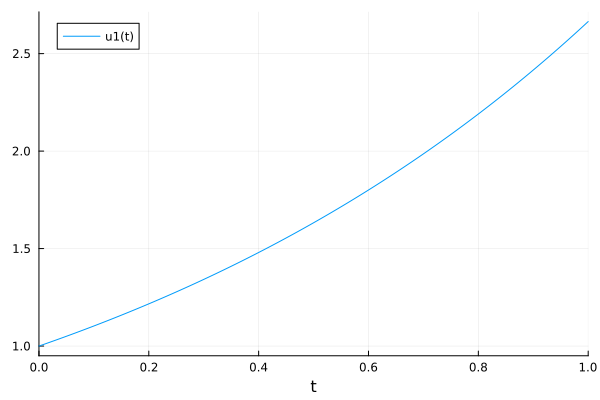

In [3]:
using Plots;gr()
plot(sol)

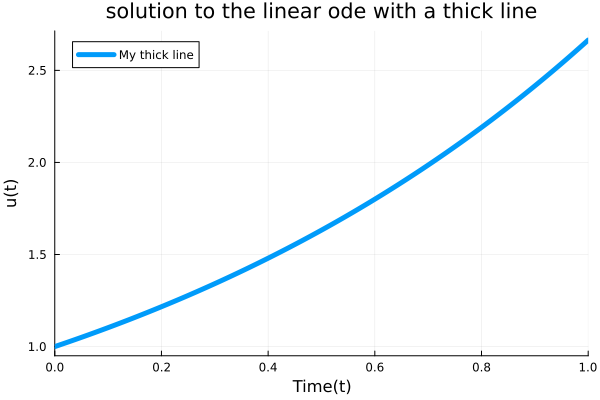

In [5]:
plot(sol,linewidth=5,title="solution to the linear ode with a thick line", xaxis="Time(t)", 
    yaxis="u(t)",label="My thick line")
#legand = false

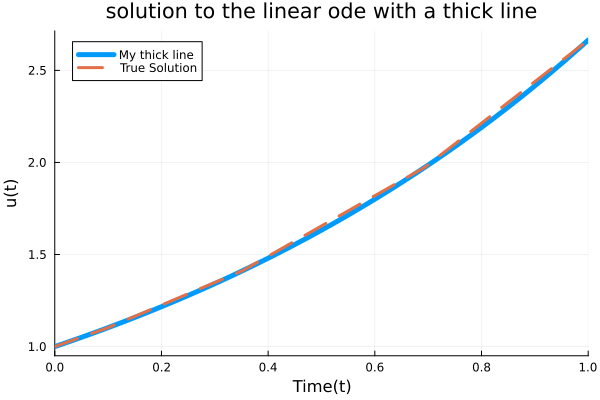

In [6]:
#! is mutate like r
plot!(sol.t,t->1.0*exp(0.98t),lw=3,ls=:dash, label="True Solution!")

In [13]:
sol.t #time point the solutions hold
println(sol.t)
println(sol.u)

[0.0, 0.10042494449239292, 0.35218603951893646, 0.6934436334555072, 1.0]
[1.0, 1.1034222047865465, 1.4121908848175448, 1.9730384867968267, 2.664456142481423]


In [16]:
tuples(sol)

5-element Vector{Tuple{Float64, Float64}}:
 (1.0, 0.0)
 (1.1034222047865465, 0.10042494449239292)
 (1.4121908848175448, 0.35218603951893646)
 (1.9730384867968267, 0.6934436334555072)
 (2.664456142481423, 1.0)

In [14]:
[t+u for(u,t) in tuples(sol)]

5-element Vector{Float64}:
 1.0
 1.2038471492789395
 1.7643769243364813
 2.6664821202523337
 3.664456142481423

In [17]:
# whether it is continuous solution
sol 
#Interpolation: specialized 4th order "free" interpolation= continuous

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 5-element Vector{Float64}:
 0.0
 0.10042494449239292
 0.35218603951893646
 0.6934436334555072
 1.0
u: 5-element Vector{Float64}:
 1.0
 1.1034222047865465
 1.4121908848175448
 1.9730384867968267
 2.664456142481423

In [18]:
sol(0.45) # the u at time point0.45

1.554261048055459

In [19]:
#reltol: accuracy in most cases
#abstol: accuracy close to 0
#rule of thumb: actual tolerance i want to digits less than the relative tolerance
sol= solve(prob, reltol=1e-10, abstol=1e-10 )

retcode: Success
Interpolation: specialized 9th order lazy interpolation, specialized 4rd order "free" stiffness-aware interpolation
t: 8-element Vector{Float64}:
 0.0
 0.050244592052897885
 0.1512468473371375
 0.3232732438928879
 0.5271625163388169
 0.7438344153075385
 0.979604866173232
 1.0
u: 8-element Vector{Float64}:
 1.0
 1.0504721189538209
 1.1597702328742405
 1.3727386773825645
 1.6763507630835581
 2.0729189339095937
 2.6117298219959477
 2.6644562419294293

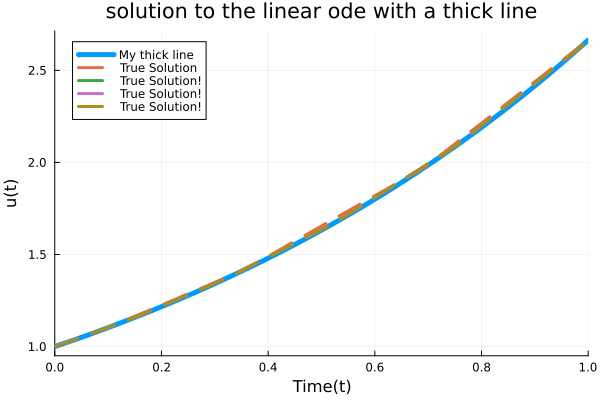

In [23]:
plot!(sol.t,t->1.0*exp(0.98t),lw=3,ls=:dash, label="True Solution!")

In [26]:
# specified time point
sol= solve(prob, saveat=0.1,save_start = false, save_end = false)
#save_start: do not show the initial


retcode: Success
Interpolation: 1st order linear
t: 10-element Vector{Float64}:
 0.1
 0.2
 0.3
 0.4
 0.5
 0.6
 0.7
 0.8
 0.9
 1.0
u: 10-element Vector{Float64}:
 1.1029627851292922
 1.2165269512238264
 1.341783821227542
 1.4799379510586805
 1.6323162070542376
 1.8003833264979388
 1.9857565541587578
 2.1902158127997615
 2.4157257420847684
 2.664456142481423

In [25]:
# specified time point
sol=solve(prob, saveat=[0.2,0.3,0.9])

retcode: Success
Interpolation: 1st order linear
t: 3-element Vector{Float64}:
 0.2
 0.3
 0.9
u: 3-element Vector{Float64}:
 1.2165269512238264
 1.341783821227542
 2.4157257420847684

In [27]:
#dense： continuous.dense: 
#Denotes whether to save the extra pieces required for continuous output. 
#Default is save_everystep && isempty(saveat) for algorithms 
#which have the ability to produce dense output, 
#If dense=false, the solution still acts like a function, 
#and sol(t) is a linear interpolation 线性插值 between the saved time points.
sol=solve(prob, dense=false)

retcode: Success
Interpolation: 1st order linear
t: 5-element Vector{Float64}:
 0.0
 0.10042494449239292
 0.35218603951893646
 0.6934436334555072
 1.0
u: 5-element Vector{Float64}:
 1.0
 1.1034222047865465
 1.4121908848175448
 1.9730384867968267
 2.664456142481423

In [28]:
###How to choose solver algorithms
##stiffness model, to very large F(jacob)
#solver are very slow

sol= solve(prob,alg_hints=[:stiff])

#Vector{Symbol} which describe the problem at a high level to the solver
#:auto vs :nonstiff vs :stiff - 
#Denotes the equation as nonstiff/stiff. 
#:auto allow the default handling algorithm to choose stiffness detection algorithms

retcode: Success
Interpolation: specialized 3rd order "free" stiffness-aware interpolation
t: 8-element Vector{Float64}:
 0.0
 0.05653299582822294
 0.17270731152826024
 0.3164602871490142
 0.5057500493966304
 0.7292242404177713
 0.9912979258615463
 1.0
u: 8-element Vector{Float64}:
 1.0
 1.0569657840332976
 1.1844199383303913
 1.3636037723365293
 1.6415400217287892
 2.043449252667953
 2.641826718386915
 2.6644526430975057

In [31]:
# we can choose solver directly
sol=solve(prob, Tsit5(),reltol=1e-8)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 11-element Vector{Float64}:
 0.0
 0.02527080401386777
 0.0875230056025872
 0.16898519878165336
 0.2660392363867261
 0.3792696185821027
 0.5056473432875428
 0.6435167131891327
 0.790199997822735
 0.9435912496162883
 1.0
u: 11-element Vector{Float64}:
 1.0
 1.0250745974412026
 1.0895584751316967
 1.1801074513690548
 1.2978622030699263
 1.450174981821554
 1.6413751499277125
 1.8788246198775327
 2.1692814814414327
 2.5211607865886214
 2.6644562431061853

In [32]:
#example: lorenz
function parameterized_lorenz!(du, u, p, t)
    x, y, z = u
    σ, ρ, β = p
    du[1] = dx = σ * (y - x)
    du[2] = dy = x * (ρ - z) - y
    du[3] = dz = x * y - β * z
end

parameterized_lorenz! (generic function with 1 method)

In [37]:
u0 = [1.0,0.0,0.0]
p = (10,28,8/3)
tspan=(0.0,100.0)


(0.0, 100.0)

In [38]:
prob = ODEProblem(parameterized_lorenz!,u0,tspan,p)
sol = solve(prob)

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 1263-element Vector{Float64}:
   0.0
   3.5678604836301404e-5
   0.0003924646531993154
   0.0032624077544510573
   0.009058075635317072
   0.01695646895607931
   0.02768995855685593
   0.04185635042021763
   0.06024041165841079
   0.08368541255159562
   0.11336499649094857
   0.1486218182609657
   0.18703978481550704
   ⋮
  99.05535949898116
  99.14118781914485
  99.22588252940076
  99.30760258626904
  99.39665422328268
  99.49536147459878
  99.58822928767293
  99.68983993598462
  99.77864535713971
  99.85744078539504
  99.93773320913628
 100.0
u: 1263-element Vector{Vector{Float64}}:
 [1.0, 0.0, 0.0]
 [0.9996434557625105, 0.0009988049817849058, 1.781434788799208e-8]
 [0.9961045497425811, 0.010965399721242457, 2.146955365838907e-6]
 [0.9693591634199452, 0.08977060667778931, 0.0001438018342266937]
 [0.9242043615038835, 0.24228912482984957, 0.001046162

In [39]:
#grab elements
sol.t[10],sol[10]
sol[2,10] #the second components (are the y value) at time t[10}

(0.08368541255159562, [1.088863826836895, 2.052326595543049, 0.0740257368585531])

In [42]:
A = convert(Array,sol)
#solution matrix sol[i,j] = A[i,j]

3×1263 Matrix{Float64}:
 1.0  0.999643     0.996105    0.969359     …   8.10973   4.95863   3.80201
 0.0  0.000998805  0.0109654   0.0897706        3.24951   2.19492   2.78702
 0.0  1.78143e-8   2.14696e-6  0.000143802     31.9705   26.9484   23.4206

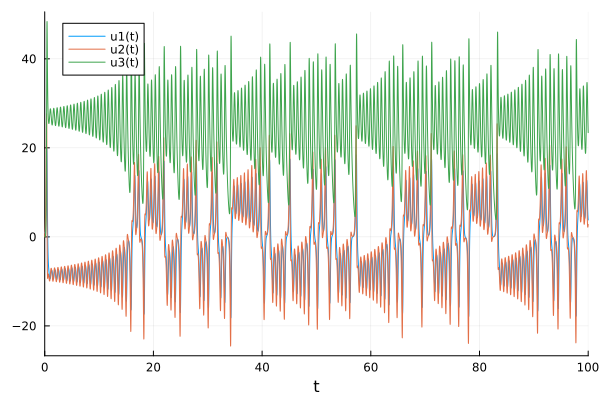

In [44]:
plot(sol)

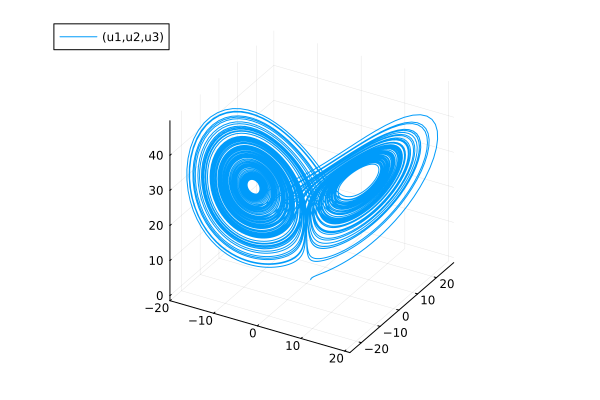

In [46]:
plot(sol,vars=(1,2,3)) # x*y*z
# 3 dimention plot

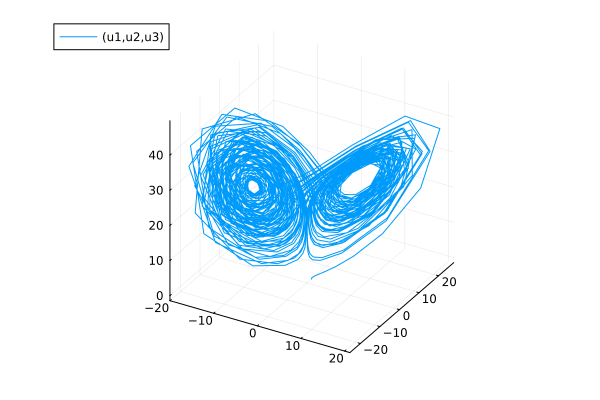

In [47]:
plot(sol,vars=(1,2,3),denseplot=false) # x*y*z
# not continuous, plot stepdad. using linear interpolation

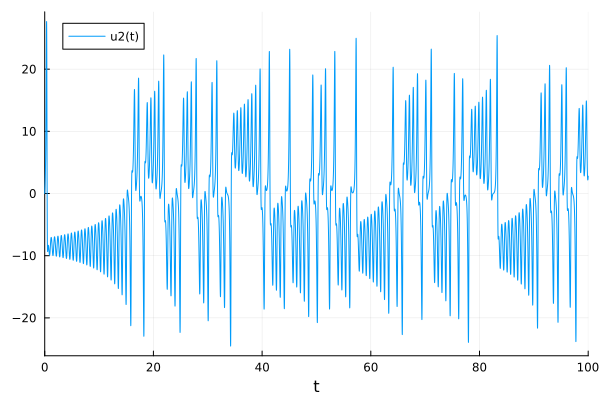

In [49]:
plot(sol,vars=(0,2))
#t*y


In [62]:

function Lotk(du, u, p, t)
    x, y = u
    a,b,c,d = p
    du[1] = dx = a*x - b*x*y
    du[2] = dy = -c*y + d*x*y
end


Lotk (generic function with 1 method)

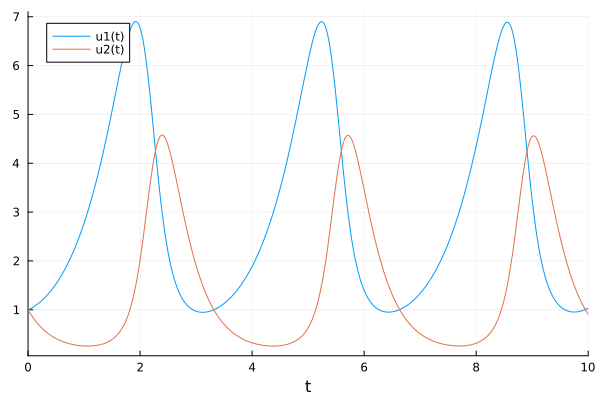

In [64]:
u0 = [1.0,1.0]
p = (1.5,1.0,3.0,1.0)
tspan = (0.0,10.0)
prob = ODEProblem(Lotk,u0, tspan,p)
sol= solve(prob)
plot(sol)

In [65]:
Lotk.Jex

LoadError: type #Lotk has no field Jex

In [77]:
### internal types: like matric
## different types of input given
A = [1 0 0 -5
    4 -2 4 -3
    -4 0 0 1
    5 -2 2 3]



4×4 Matrix{Int64}:
  1   0  0  -5
  4  -2  4  -3
 -4   0  0   1
  5  -2  2   3

In [82]:
u0 = rand(4,2)
tspan = (0.0,1.0)
f(u,p,t)= A*u
prob = ODEProblem(f,u0, tspan)
sol= solve(prob)

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 11-element Vector{Float64}:
 0.0
 0.030930879458102016
 0.09061140191812436
 0.15830147677561185
 0.2482553222077807
 0.3487896135811021
 0.46134653794928776
 0.6057327637838128
 0.7532177470127155
 0.9286929694781045
 1.0
u: 11-element Vector{Matrix{Float64}}:
 [0.026164922489048226 0.8104248424124205; 0.168347697994915 0.5647525604019848; 0.2854111749918813 0.16206173851156058; 0.4810875641834189 0.2903245443395953]
 [-0.05282772724368327 0.7803507663119004; 0.1461213931722123 0.6086397016454332; 0.30267151622078264 0.07438735723742923; 0.5346751459177805 0.41726753288152185]
 [-0.2344658110153789 0.663304115122838; 0.07453596798214354 0.6122913518551633; 0.3708733048676146 -0.0673883732824555; 0.6228883340471311 0.6570111648853647]
 [-0.48220978961852584 0.43479724444588075; -0.04055024110317623 0.49395975859151664; 0.5117231393865694 -0.165101899

In [83]:
# if we want arbitrary precision floating point numbers, 
#we can change the input to be a matrix of bigfloat
big_u0 = big.(u0)


4×2 Matrix{BigFloat}:
 0.0261649  0.810425
 0.168348   0.564753
 0.285411   0.162062
 0.481088   0.290325

In [84]:
sol[1,3]
sol.t[1]

-0.2344658110153789

In [87]:
###Chossing ode algorithm



In [96]:
## dianosing stiffness
function vanderpol(du, u, p, t)
    a = p
    x, y = u
    du[1] = dx = 1*y
    du[2] = dy = a*((1-x^2)*y-x)
end

prob = ODEProblem(vanderpol, [0.0, 2.0], (0.0,6.3),1e10) #1e6 is a

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 6.3)
u0: 2-element Vector{Float64}:
 0.0
 2.0

In [97]:
sol = solve(prob)
########why it is not showing nonstiffness

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 2723-element Vector{Float64}:
 0.0
 9.999999999999801e-11
 1.617909634196674e-10
 2.462236925640315e-10
 3.2958787463539134e-10
 4.2116119707580325e-10
 5.16488465098468e-10
 6.164833138662122e-10
 7.200723022438708e-10
 8.269771978754453e-10
 9.366991082268677e-10
 1.0488852161999824e-9
 1.1631902501252063e-9
 ⋮
 6.106925814355391
 6.1102300396365425
 6.1161817183556595
 6.12511532059867
 6.138014340139199
 6.154794196293206
 6.175897264755855
 6.200720540266459
 6.229200880709565
 6.260399857550096
 6.293993307511979
 6.3
u: 2723-element Vector{Vector{Float64}}:
 [0.0, 2.0]
 [3.4361977559266806e-10, 5.436197755783059]
 [8.084371256646091e-10, 10.084371256161235]
 [2.14598802419699e-9, 23.45988024031636]
 [5.199616302591899e-9, 53.99616302137857]
 [1.3291002829684436e-8, 134.91002828439574]
 [3.479643580403367e-8, 349.9643580065731]
 [9.491887507602

In [99]:
sol = solve(prob,alg_hints = [:stiff])

retcode: Success
Interpolation: specialized 3rd order "free" stiffness-aware interpolation
t: 1247-element Vector{Float64}:
 0.0
 6.682480216098156e-11
 9.126341174578779e-11
 1.3763367940629533e-10
 1.7394683825412095e-10
 2.1826256904529929e-10
 2.625782998364776e-10
 3.0846429717232776e-10
 3.547757465835572e-10
 4.018833835222795e-10
 4.4938804182428846e-10
 4.973402309806404e-10
 5.455806949950343e-10
 ⋮
 6.098478522741783
 6.098478534297777
 6.098478642652515
 6.098479726199896
 6.098490561673704
 6.098598916411782
 6.099682463792558
 6.110517937600316
 6.1468305412810205
 6.198453529662944
 6.261878045774516
 6.3
u: 1247-element Vector{Vector{Float64}}:
 [0.0, 2.0]
 [1.901294982702108e-10, 3.9012949826456285]
 [2.981315571290322e-10, 4.981315571222711]
 [5.919928121720133e-10, 7.9199281216610355]
 [9.387421308652253e-10, 11.387421308242255]
 [1.5737038049823525e-9, 17.73703804845435]
 [2.562719585776126e-9, 27.627195856101988]
 [4.171305407390855e-9, 43.71305407187401]
 [6.74597

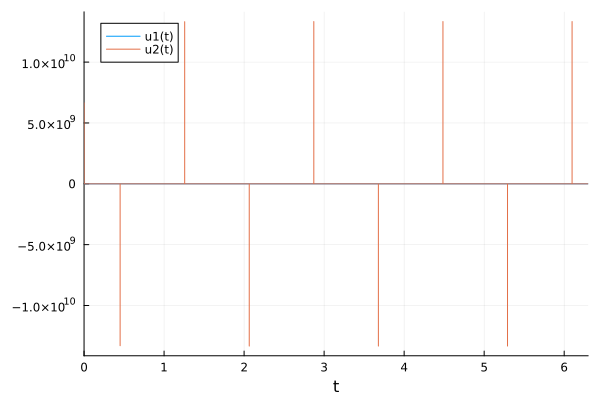

In [107]:
using Plots; gr()
sol = solve(prob, alg_hints = [:stiff], reltol=1e-4)
plot(sol, denseplot=false)

#####why there is no u1(t), (so close to 0?)

#### how to analyse the plot

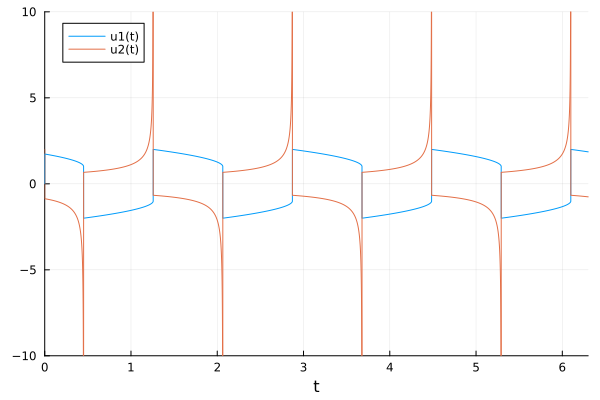

In [110]:
plot(sol, ylims = (-10.0,10.0))
#proof of unstiffness, the derivatives at certain point are extremely huge, and the algorithm not ablt
#to take enough time steps--use still solver equation 

In [114]:
using BenchmarkTools
#compare non-still and stiff solver
function lorenz!(du, u, p, t)
    a,b,c = p
    du[1] = a * (u[2] - u[1])
    du[2] = u[1] * (b - u[3]) - u[2]
    du[3] = u[1] * u[2] - c * u[3]
end
u0 = [1.0,0.0,0.0]
p = (10,28,8/3)
tspan=(0.0,100.0)
prob = ODEProblem(lorenz!, u0, tspan,p)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 100.0)
u0: 3-element Vector{Float64}:
 1.0
 0.0
 0.0

In [115]:
#use @btime macro from benchmark tools to compare the use of non-stiff and stiff solver 
@btime solve(prob)
#accurate timing of solving the problem


  665.294 μs (11477 allocations: 1022.78 KiB)


retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 1263-element Vector{Float64}:
   0.0
   3.5678604836301404e-5
   0.0003924646531993154
   0.0032624077544510573
   0.009058075635317072
   0.01695646895607931
   0.02768995855685593
   0.04185635042021763
   0.06024041165841079
   0.08368541255159562
   0.11336499649094857
   0.1486218182609657
   0.18703978481550704
   ⋮
  99.05535949898116
  99.14118781914485
  99.22588252940076
  99.30760258626904
  99.39665422328268
  99.49536147459878
  99.58822928767293
  99.68983993598462
  99.77864535713971
  99.85744078539504
  99.93773320913628
 100.0
u: 1263-element Vector{Vector{Float64}}:
 [1.0, 0.0, 0.0]
 [0.9996434557625105, 0.0009988049817849058, 1.781434788799208e-8]
 [0.9961045497425811, 0.010965399721242457, 2.146955365838907e-6]
 [0.9693591634199452, 0.08977060667778931, 0.0001438018342266937]
 [0.9242043615038835, 0.24228912482984957, 0.001046162

In [116]:
@btime solve(prob, alg_hints=[:stiff])
# it is much slower than default, but lorenz is not stiff, we better choose default to save time

  3.573 ms (11869 allocations: 1.03 MiB)


retcode: Success
Interpolation: specialized 3rd order "free" stiffness-aware interpolation
t: 2287-element Vector{Float64}:
   0.0
   3.5678604836301404e-5
   0.0003924646531993154
   0.0015292937978620778
   0.003162305724282332
   0.005285973369695991
   0.008023688791697185
   0.011441012874024603
   0.01566934104559553
   0.020826705795265424
   0.027060318017063052
   0.03451357011343427
   0.04332692024624461
   ⋮
  99.62331743031588
  99.65165731894739
  99.68029462142343
  99.7099830400013
  99.74102863528643
  99.77510965162215
  99.81230429491325
  99.85453170007092
  99.9019884991296
  99.9498478832549
  99.9977072673802
 100.0
u: 2287-element Vector{Vector{Float64}}:
 [1.0, 0.0, 0.0]
 [0.9996434557625105, 0.0009988049817849047, 1.7814347887985208e-8]
 [0.9961045497425969, 0.0109653997212298, 2.146955365112677e-6]
 [0.9851473616483439, 0.04246652425810003, 3.21927130421189e-5]
 [0.9702414465725462, 0.08706126023105658, 0.00013525574346441506]
 [0.9522854561249812, 0.14396667

In [ ]:
##the recommended methods
# higher orders- low tolerances（1e-8）, low order - higher tolerance
#default: Tsit5()
#low tolerance(1e-8): Vern7(), Vern9()
# high tolerance, BS3()
#still: Rosenbrock23(), Rodas4(),

In [ ]:
### Optimizing diffeq code
##right algorithm + derivatives function is optimized = best solve


In [121]:
#Otimizing small systems（<100 equations）
# eg lorenz
#example: lorenz
function lorenz(du, u, p, t)
    x, y, z = u
    σ, ρ, β = p
    du[1] = dx = σ * (y - x)
    du[2] = dy = x * (ρ - z) - y
    du[3] = dz = x * y - β * z
end
u0 = [1.0,0.0,0.0]
p = (10,28,8/3)
tspan=(0.0,100.0)
prob = ODEProblem(lorenz,u0,tspan,p)
@benchmark solve(prob,Tsit5())

BenchmarkTools.Trial: 5439 samples with 1 evaluation.
 Range (min … max):  681.425 μs …  15.733 ms  ┊ GC (min … max): 0.00% … 84.44%
 Time  (median):     767.871 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   913.171 μs ± 858.494 μs  ┊ GC (mean ± σ):  9.31% ±  9.34%

  █▆▄▃▃▂                                                        ▁
  ████████▇▆▅▅▃▃▅▃▃▁▁▁▁▃▁▃▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▄▄ █
  681 μs        Histogram: log(frequency) by time       7.56 ms <

 Memory estimate: 996.36 KiB, allocs estimate: 11415.

In [122]:
## optimizing large systems
A = rand(1000,1000)
B = rand(1000,1000)
C = rand(1000,1000)
test(A,B,C) = A+B+C

test (generic function with 1 method)

In [126]:
function test3(A,B,C)
    D=similar(A)
    @inbounds for i in eachindex(A)
        D[i] = A[i]+B[i]+C[i]
    end
    D
end



test3 (generic function with 1 method)

In [128]:
#it is the same as
test4(A,B,C) = A.+B.+C
@benchmark test4

BenchmarkTools.Trial: 10000 samples with 1000 evaluations.
 Range (min … max):  1.473 ns … 105.216 ns  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     1.721 ns               ┊ GC (median):    0.00%
 Time  (mean ± σ):   1.787 ns ±   1.391 ns  ┊ GC (mean ± σ):  0.00% ± 0.00%

    ▁   █                                                      
  ▆██▅▄▃█▄▄▃▂▃▃▂▅▂▂▁▂▁▁▂▁▂▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▁▁▂▂▂▂▂▂▂ ▂
  1.47 ns         Histogram: frequency by time        3.86 ns <

 Memory estimate: 0 bytes, allocs estimate: 0.

In [ ]:
#@. means .everything
#eg.
test5(A,B,C) = @. A+B+C

In [130]:
# or 
D = zeros(1000,1000)
test6!(D,A,B,C) = D.= A.+B.+C

test6! (generic function with 1 method)

In [136]:
#Example Optimization: Gierer-Meinhardt Reaction-Diffusion PDE Discretization
# Generate the constants
using LinearAlgebra
p = (1.0,1.0,1.0,10.0,0.001,100.0) # a,α,ubar,β,D1,D2
N = 100
Ax = Array(Tridiagonal([1.0 for i in 1:N-1],[-2.0 for i in 1:N],[1.0 for i in 1:N-1]))
Ay = copy(Ax)
Ax[2,1] = 2.0
Ax[end-1,end] = 2.0
Ay[1,2] = 2.0
Ay[end,end-1] = 2.0
# A is the tridiagonal stencil [1,−2,1]
#here are building A
# u v and A are matrices 


function basic_version!(dr,r,p,t)
  a,α,ubar,β,D1,D2 = p
  u = r[:,:,1] # the first 100*100 matric
  v = r[:,:,2] # the second 100*100 matric
  Du = D1*(Ay*u + u*Ax)
  Dv = D2*(Ay*v + v*Ax)
  dr[:,:,1] = Du .+ a.*u.*u./v .+ ubar .- α*u
  dr[:,:,2] = Dv .+ a.*u.*u .- β*v
end

a,α,ubar,β,D1,D2 = p
uss = (ubar+β)/α
vss = (a/β)*uss^2
r0 = zeros(100,100,2)
r0[:,:,1] .= uss.+0.1.*rand.()
r0[:,:,2] .= vss

prob = ODEProblem(basic_version!,r0,(0.0,0.1),p)

ODEProblem with uType Array{Float64, 3} and tType Float64. In-place: true
timespan: (0.0, 0.1)
u0: 100×100×2 Array{Float64, 3}:
[:, :, 1] =
 11.0458  11.0037  11.0622  11.099   …  11.0132  11.0689  11.0661  11.0505
 11.0548  11.053   11.0016  11.0365     11.0906  11.004   11.0494  11.008
 11.0685  11.001   11.048   11.0408     11.0987  11.0283  11.03    11.092
 11.0734  11.0961  11.0629  11.0338     11.0383  11.021   11.06    11.0913
 11.0216  11.0145  11.0472  11.0304     11.0001  11.0468  11.0412  11.0148
 11.0125  11.0341  11.0518  11.0533  …  11.0871  11.0275  11.0458  11.0997
 11.026   11.0512  11.0473  11.0183     11.052   11.091   11.0102  11.0287
 11.0039  11.0821  11.0538  11.0184     11.0545  11.0123  11.0571  11.0386
 11.0224  11.0042  11.0267  11.0786     11.0214  11.0735  11.0237  11.0728
 11.0042  11.0252  11.0839  11.0702     11.0228  11.0847  11.0829  11.0113
 11.0616  11.0623  11.0739  11.0682  …  11.0731  11.0001  11.0587  11.0249
 11.0344  11.0818  11.055   11.0882  

100×100 Matrix{Float64}:
 -2.0   1.0   0.0   0.0   0.0   0.0  …   0.0   0.0   0.0   0.0   0.0   0.0
  1.0  -2.0   1.0   0.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   1.0  -2.0   1.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   1.0  -2.0   1.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   1.0  -2.0   1.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   1.0  -2.0  …   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   1.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0  …   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0      0.0   0.0   0.0   0.0   0.0   0.0


In [138]:
#optimize the code (create views that point to these parts)
A=rand(4)
@show A
B = @view A[1:3]
# here is the example
function gm2!(dr,r,p,t)
  a,α,ubar,β,D1,D2 = p
  u = @view r[:,:,1]
  v = @view r[:,:,2]
  du = @view dr[:,:,1]
  dv = @view dr[:,:,2]
  Du = D1*(Ay*u + u*Ax)
  Dv = D2*(Ay*v + v*Ax)
  @. du = Du + a.*u.*u./v + ubar - α*u
  @. dv = Dv + a.*u.*u - β*v
end
prob = ODEProblem(gm2!,r0,(0.0,0.1),p)
@benchmark solve(prob,Tsit5())

A = [0.879319939822307, 0.6688321598089074, 0.44290103513569135, 0.18264426572109538]


BenchmarkTools.Trial: 21 samples with 1 evaluation.
 Range (min … max):  232.135 ms … 304.088 ms  ┊ GC (min … max): 5.14% … 3.82%
 Time  (median):     241.251 ms               ┊ GC (median):    5.78%
 Time  (mean ± σ):   245.019 ms ±  14.597 ms  ┊ GC (mean ± σ):  6.68% ± 2.18%

       █▁▁▁                                                      
  ▆▆▁▆▁████▁▆▆▆▁▆▆▆▆▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▆ ▁
  232 ms           Histogram: frequency by time          304 ms <

 Memory estimate: 119.71 MiB, allocs estimate: 5879.

In [139]:
Ayu = zeros(N,N)
uAx = zeros(N,N)
Du = zeros(N,N)
Ayv = zeros(N,N)
vAx = zeros(N,N)
Dv = zeros(N,N)
function gm3!(dr,r,p,t)
  a,α,ubar,β,D1,D2 = p
  u = @view r[:,:,1]
  v = @view r[:,:,2]
  du = @view dr[:,:,1]
  dv = @view dr[:,:,2]
  mul!(Ayu,Ay,u)
  mul!(uAx,u,Ax)
  mul!(Ayv,Ay,v)
  mul!(vAx,v,Ax)
  @. Du = D1*(Ayu + uAx)
  @. Dv = D2*(Ayv + vAx)
  @. du = Du + a*u*u./v + ubar - α*u
  @. dv = Dv + a*u*u - β*v
end
prob = ODEProblem(gm3!,r0,(0.0,0.1),p)
@benchmark solve(prob,Tsit5())

BenchmarkTools.Trial: 35 samples with 1 evaluation.
 Range (min … max):  125.929 ms … 172.175 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     143.151 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   142.941 ms ±  10.005 ms  ┊ GC (mean ± σ):  2.22% ± 3.92%

         █         ▁ ▁ ▁▁ ▄                                      
  ▆▁▁▆▆▁▁█▆▁▁▆▁▁▆▁▁█▁█▆██▆█▆▆▆▆▁▆▆▁▁▆▁▁▆▆▁▁▆▁▁▁▁▁▁▆▁▁▁▁▁▁▁▁▁▁▁▆ ▁
  126 ms           Histogram: frequency by time          172 ms <

 Memory estimate: 29.97 MiB, allocs estimate: 4703.

In [142]:
###Callbacks and Events
#callback: utilize rootfinding on the interpolation to find the "exact" time point 
#at which the condition takes place and apply the affect! at that time point.


using DifferentialEquations, ParameterizedFunctions
ball! = @ode_def BallBounce begin
  dy =  v
  dv = -9.8
end g

(::BallBounce{var"###ParameterizedDiffEqFunction#2359", var"###ParameterizedTGradFunction#2360", var"###ParameterizedJacobianFunction#2361", Nothing, Nothing, ODESystem}) (generic function with 1 method)

In [143]:
# We want the callback to trigger when y=0 since that's when the ball will hit the Earth's surface (our event). 


function condition(u,t,integrator) #event when event_f(u,t)=0
  u[1]
end

function affect!(integrator)
    integrator.u[2] = -integrator.p[2] * integrator.u[2] #add velocity
end
# it will evaluate to zero when u[1] == 0, which occurs when v == 0

#a percentage of the velocity will be retained when the event is triggered and the callback is used
function affect!(integrator)
    integrator.u[2] = -integrator.p[2] * integrator.u[2]
end

affect! (generic function with 1 method)

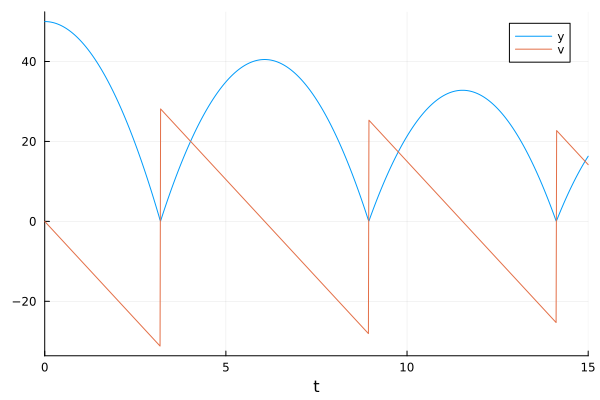

In [145]:
#build the ContinuousCallback:
bounce_cb = ContinuousCallback(condition,affect!)

u0 = [50.0,0.0]
tspan = (0.0,15.0)
p = (9.8,0.9)
prob = ODEProblem(ball!,u0,tspan,p,callback=bounce_cb)

sol = solve(prob,Tsit5())
using Plots; gr()
plot(sol)


In [ ]:
## Discrete Callbacks
# A discrete callback checks a condition after every integration step and, 
#if true, it will apply an affect!.

In [147]:
#example
function condition_kick(u,t,integrator)
    t == 2
end

condition_kick (generic function with 1 method)

In [148]:
function affect_kick!(integrator)
    integrator.u[2] += 50 #if satisfy ,it will apply
end

kick_cb = DiscreteCallback(condition_kick,affect_kick!)
u0 = [50.0,0.0]
tspan = (0.0,10.0)
p = (9.8,0.9)
prob = ODEProblem(ball!,u0,tspan,p,callback=kick_cb)


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 10.0)
u0: 2-element Vector{Float64}:
 50.0
  0.0

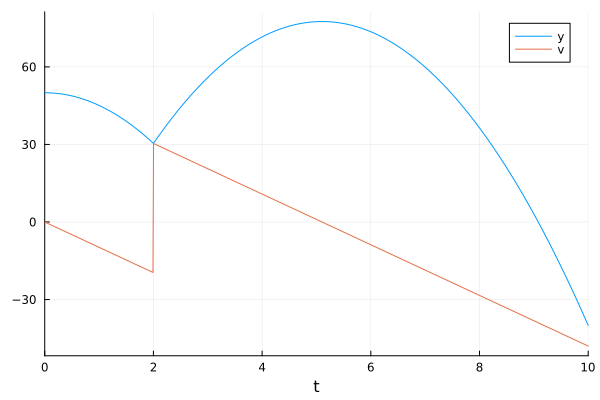

In [149]:
sol = solve(prob,Tsit5(),tstops=[2.0])# when it satisfy t=2, it will conduct affect_kick

plot(sol)

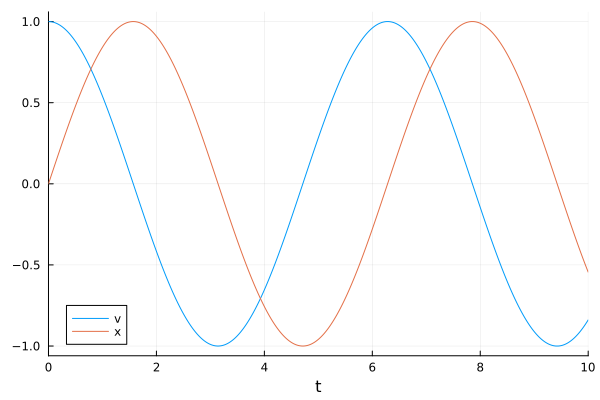

In [150]:
### Integration Termination and Directional HAndling
u0 = [1.,0.]
harmonic! = @ode_def HarmonicOscillator begin
   dv = -x
   dx = v
end
tspan = (0.0,10.0)
prob = ODEProblem(harmonic!,u0,tspan)
sol = solve(prob)
plot(sol)

In [151]:
#stop the integration at that point
function terminate_affect!(integrator)
    terminate!(integrator)
end

terminate_affect! (generic function with 1 method)

In [152]:
# stop the integration particle moves back to x=0.
function terminate_condition(u,t,integrator)
    u[2]
end
terminate_cb = ContinuousCallback(terminate_condition,terminate_affect!)


ContinuousCallback{typeof(terminate_condition), typeof(terminate_affect!), typeof(terminate_affect!), typeof(SciMLBase.INITIALIZE_DEFAULT), typeof(SciMLBase.FINALIZE_DEFAULT), Float64, Int64, Rational{Int64}, Nothing, Int64}(terminate_condition, terminate_affect!, terminate_affect!, SciMLBase.INITIALIZE_DEFAULT, SciMLBase.FINALIZE_DEFAULT, nothing, SciMLBase.LeftRootFind, 10, Bool[1, 1], 1, 2.220446049250313e-15, 0, 1//100)

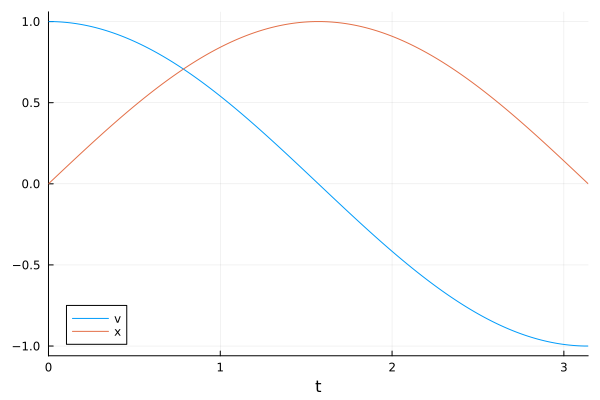

In [153]:
sol = solve(prob,callback=terminate_cb)
plot(sol)

In [154]:
##  SavingCallback 
#can be used to allow for special saving behavior.
prob = ODEProblem((du,u,p,t)->du.=u,rand(1000,1000),(0.0,1.0))


ODEProblem with uType Matrix{Float64} and tType Float64. In-place: true
timespan: (0.0, 1.0)
u0: 1000×1000 Matrix{Float64}:
 0.403136  0.923335  0.0229701  0.62595   …  0.852444   0.353535   0.755512
 0.993988  0.112274  0.201694   0.885432     0.0854302  0.949599   0.549561
 0.134536  0.388687  0.464608   0.881345     0.497182   0.808869   0.135359
 0.475637  0.69081   0.892858   0.358143     0.199948   0.620787   0.185854
 0.893016  0.140657  0.0197803  0.912663     0.663315   0.835213   0.488363
 0.913832  0.679545  0.0698617  0.750087  …  0.633977   0.425218   0.489319
 0.602772  0.232425  0.427528   0.832016     0.436231   0.940328   0.826537
 0.335812  0.161793  0.79916    0.661057     0.544602   0.378825   0.869926
 0.320867  0.783864  0.323612   0.351609     0.785897   0.377834   0.595366
 0.56571   0.318908  0.0145413  0.580031     0.186586   0.661598   0.0690206
 0.820156  0.303671  0.242442   0.904383  …  0.570043   0.0521446  0.768471
 0.815055  0.482958  0.942764   0.32823

In [155]:
saved_values = SavedValues(Float64, Tuple{Float64,Float64})


SavedValues{tType=Float64, savevalType=Tuple{Float64, Float64}}
t:
Float64[]
saveval:
Tuple{Float64, Float64}[]

In [156]:
# define the SavingCallback by giving it a function of (u,p,t,integrator) that 
#returns the values to save, 
using LinearAlgebra
cb = SavingCallback((u,t,integrator)->(tr(u),norm(u)), saved_values)


DiscreteCallback{DiffEqCallbacks.var"#30#31", DiffEqCallbacks.SavingAffect{var"#45#46", Float64, Tuple{Float64, Float64}, DataStructures.BinaryMinHeap{Float64}, Vector{Float64}}, typeof(DiffEqCallbacks.saving_initialize), typeof(SciMLBase.FINALIZE_DEFAULT)}(DiffEqCallbacks.var"#30#31"(), DiffEqCallbacks.SavingAffect{var"#45#46", Float64, Tuple{Float64, Float64}, DataStructures.BinaryMinHeap{Float64}, Vector{Float64}}(var"#45#46"(), SavedValues{tType=Float64, savevalType=Tuple{Float64, Float64}}
t:
Float64[]
saveval:
Tuple{Float64, Float64}[], DataStructures.BinaryMinHeap{Float64}(Base.Order.ForwardOrdering(), Float64[]), Float64[], true, true, true, 0), DiffEqCallbacks.saving_initialize, SciMLBase.FINALIZE_DEFAULT, Bool[0, 0])

In [157]:
sol = solve(prob, Tsit5(), callback=cb, save_everystep=false, save_start=false, save_end = false) 
# Turn off normal saving
#save callback


retcode: Success
Interpolation: 1st order linear
t: Float64[]
u: Matrix{Float64}[]

In [159]:

saved_values.saveval

5-element Vector{Tuple{Float64, Float64}}:
 (498.0814048785611, 577.3288983873053)
 (550.5364891875996, 638.1298753808824)
 (705.6756870460275, 817.952573676825)
 (986.8362898048305, 1143.8473761543974)
 (1353.9255724695104, 1569.342584557644)

In [166]:
### formatting plots
using DifferentialEquations, Plots, ParameterizedFunctions

#compare non-still and stiff solver
function lorenz!(du, u, p, t)
    a,b,c = p
    du[1] = a * (u[2] - u[1])
    du[2] = u[1] * (b - u[3]) - u[2]
    du[3] = u[1] * u[2] - c * u[3]
end
u0 = [1.0,0.0,0.0]
p = (10,28,8/3)
tspan=(0.0,100.0)
prob = ODEProblem(lorenz!, u0, tspan,p)
sol=solve(prob)

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 1263-element Vector{Float64}:
   0.0
   3.5678604836301404e-5
   0.0003924646531993154
   0.0032624077544510573
   0.009058075635317072
   0.01695646895607931
   0.02768995855685593
   0.04185635042021763
   0.06024041165841079
   0.08368541255159562
   0.11336499649094857
   0.1486218182609657
   0.18703978481550704
   ⋮
  99.05535949898116
  99.14118781914485
  99.22588252940076
  99.30760258626904
  99.39665422328268
  99.49536147459878
  99.58822928767293
  99.68983993598462
  99.77864535713971
  99.85744078539504
  99.93773320913628
 100.0
u: 1263-element Vector{Vector{Float64}}:
 [1.0, 0.0, 0.0]
 [0.9996434557625105, 0.0009988049817849058, 1.781434788799208e-8]
 [0.9961045497425811, 0.010965399721242457, 2.146955365838907e-6]
 [0.9693591634199452, 0.08977060667778931, 0.0001438018342266937]
 [0.9242043615038835, 0.24228912482984957, 0.001046162

In [162]:
plot(sol)

LoadError: BoundsError: attempt to access 0-element Vector{Matrix{Float64}} at index [1]

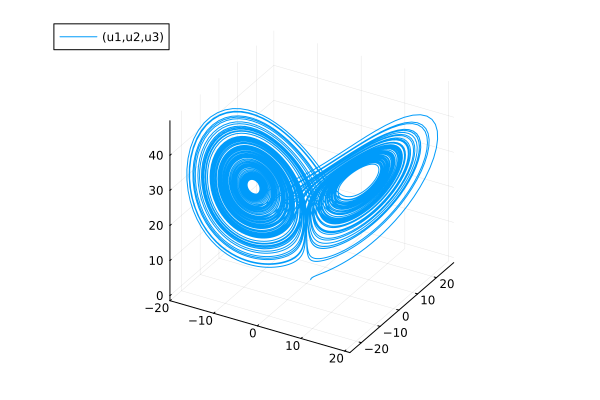

In [167]:
plot(sol,vars=(1, 2, 3))

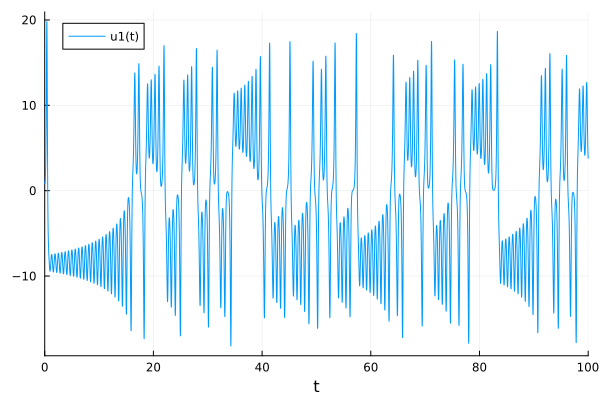

In [173]:
plot(sol,vars=[1])
# plot the timeseries for a single variable: u1

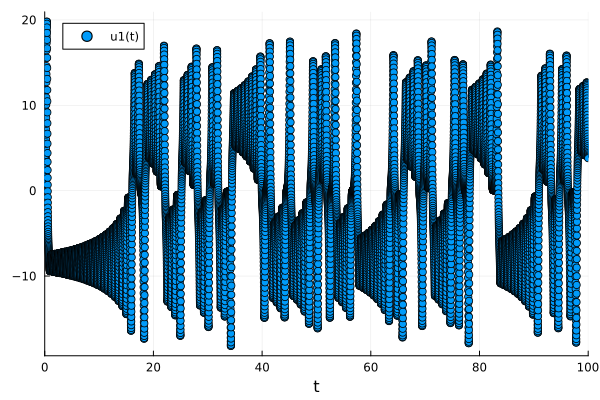

In [175]:
#scatter plot
scatter(sol,vars=[1])


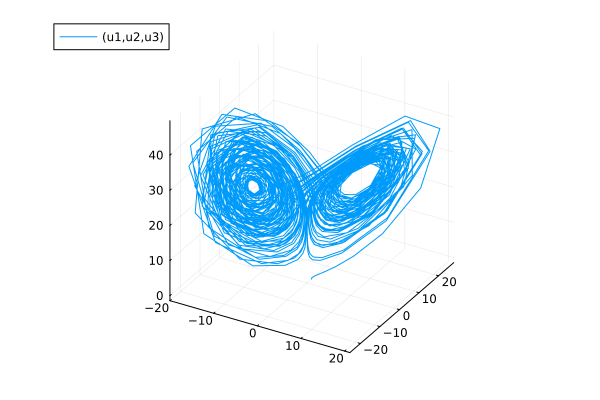

In [176]:
#not contonipis 
plot(sol,vars=(1,2,3),denseplot=false)


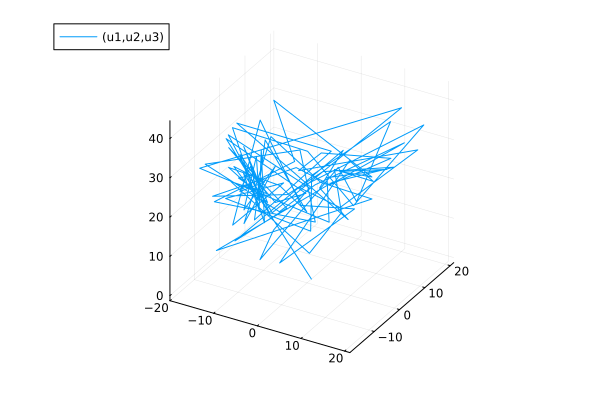

In [177]:
#plotting the entire solution using 100 points spaced evenly in time.
plot(sol,vars=(1,2,3),plotdensity=100)

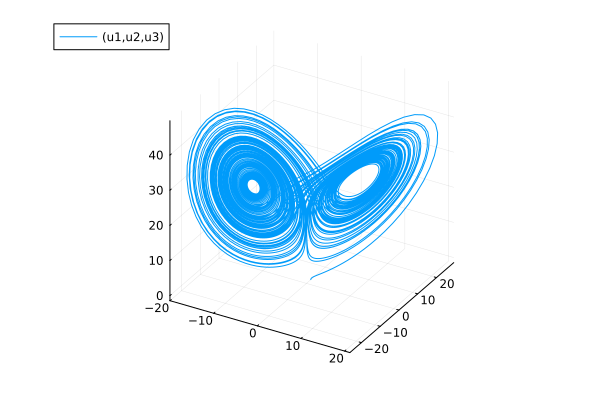

In [178]:
plot(sol,vars=(1,2,3),plotdensity=10000)

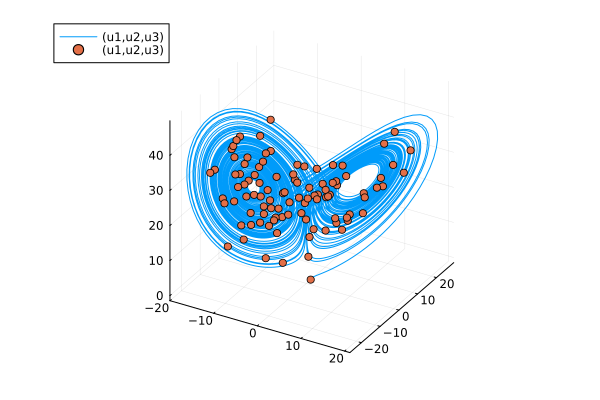

In [179]:
#we can compose plots.  the 100 points are using a scatter plot:

plot(sol,vars=(1,2,3))
scatter!(sol,vars=(1,2,3),plotdensity=100)

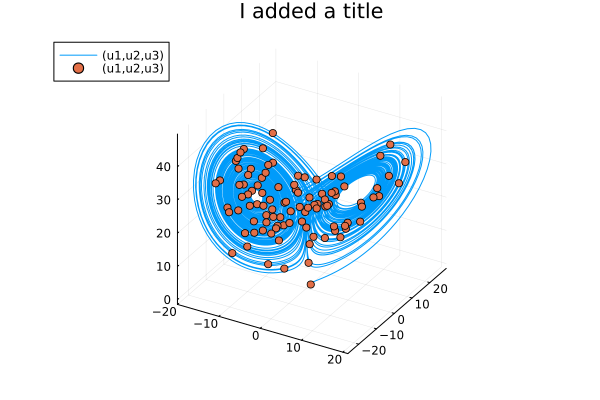

In [180]:
p = plot(sol,vars=(1,2,3))
scatter!(p,sol,vars=(1,2,3),plotdensity=100)
title!("I added a title")